In [19]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.linear_model import LogisticRegression
import joblib

In [20]:
df = pd.read_csv("./DSQIDS_I.csv")
df

,SEQN,DSDSUPID,DSDSUPP,DSDANTA,DSD070,DSDMTCH,DSD090,DSD103,DSD122Q,DSD122U,...,DSQIPHOS,DSQIMAGN,DSQIIRON,DSQIZINC,DSQICOPP,DSQISODI,DSQIPOTA,DSQISELE,DSQICAFF,DSQIIODI
0,83732.0,1000023204,METAMUCIL 100% NATURAL PSYLLIUM HUSK DAILY FIB...,0.0,2.0,4.0,1095.0,30.0,6.0,12.0,...,NaN,NaN,4.2,NaN,NaN,30.0,210.0,NaN,NaN,NaN
1,83732.0,1000029106,CENTRUM SILVER ADULTS 50+ MULTIVITAMIN / MULTI...,0.0,2.0,1.0,3650.0,30.0,1.0,1.0,...,20.0,50.0,NaN,11.0,0.5,NaN,80.0,19.0,NaN,150.0
2,83734.0,1000013205,ONE A DAY MEN'S HEALTH FORMULA MEN'S MULTIVITA...,0.0,1.0,1.0,4380.0,30.0,1.0,1.0,...,NaN,140.0,NaN,15.0,2.0,NaN,NaN,110.0,NaN,NaN
3,83736.0,1000799302,PRENATE DHA RX PRENATAL VITAMIN & DHA NEW FORM...,0.0,2.0,4.0,4.0,4.0,1.0,1.0,...,NaN,50.0,18.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83737.0,1001250500,IRWIN NATURALS 3-IN-1 JOINT FORMULA,0.0,1.0,1.0,30.0,30.0,3.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9554,93697.0,1001105301,OSTEO BI-FLEX JOINT HEALTH TRIPLE STRENGTH + V...,0.0,1.0,1.0,3650.0,30.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN
9555,93697.0,1888011300,VITAMIN B-12 (COBALAMIN) 1000 MCG,0.0,1.0,3.0,3650.0,30.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9556,93698.0,1888292806,DEFAULT GUMMY BEAR MULTIVITAMIN,0.0,2.0,5.0,91.0,30.0,2.0,20.0,...,NaN,NaN,NaN,2.7,NaN,NaN,NaN,NaN,NaN,42.0
9557,93699.0,1000292804,L'IL CRITTERS GUMMY VITES COMPLETE MULTI-VITAM...,0.0,1.0,1.0,1095.0,7.0,2.0,20.0,...,NaN,NaN,NaN,2.7,NaN,NaN,NaN,NaN,NaN,42.0


In [21]:
threshold = len(df.columns) / 4
# Drop rows with at least half null values
df.dropna(thresh=threshold, inplace=True)

In [22]:
print(df)

         SEQN    DSDSUPID                                            DSDSUPP  \
0     83732.0  1000023204  METAMUCIL 100% NATURAL PSYLLIUM HUSK DAILY FIB...   
1     83732.0  1000029106  CENTRUM SILVER ADULTS 50+ MULTIVITAMIN / MULTI...   
2     83734.0  1000013205  ONE A DAY MEN'S HEALTH FORMULA MEN'S MULTIVITA...   
3     83736.0  1000799302  PRENATE DHA RX PRENATAL VITAMIN & DHA NEW FORM...   
8     83739.0  1888031310     DEFAULT CHILDREN'S MULTIVITAMIN / MULTIMINERAL   
...       ...         ...                                                ...   
9541  93683.0  1000031403  FLINTSTONES PLUS IMMUNITY SUPPORT CHILDREN'S M...   
9546  93696.0  1000929901  GNC MEGA MEN ENERGY & METABOLISM CLINICALLY ST...   
9547  93696.0  1000930200        NATURE MADE FISH OIL 1000 MG 300 MG OMEGA-3   
9556  93698.0  1888292806                    DEFAULT GUMMY BEAR MULTIVITAMIN   
9557  93699.0  1000292804  L'IL CRITTERS GUMMY VITES COMPLETE MULTI-VITAM...   

      DSDANTA  DSD070  DSDMTCH  DSD090 

In [23]:
df.to_csv('./cleaned_data.csv', index=False)

In [24]:
import xport as xp

with open('./DSQIDS_I.XPT', 'rb') as f:
    for row in xp.Reader(f):
        print(row)

Observation(SEQN=83732.0, DSDSUPID='1000023204', DSDSUPP='METAMUCIL 100% NATURAL PSYLLIUM HUSK DAILY FIBER 4 IN 1 MULTIHEALTH FIBER! MADE WITH REAL SUGAR ORIGINAL COARSE FIBER POWDER', DSDANTA=0.0, DSD070=2.0, DSDMTCH=4.0, DSD090=1095.0, DSD103=30.0, DSD122Q=6.0, DSD122U=12.0, DSDACTSS=6.0, DSDDAY1=1.0, DSDDAY2=1.0, DSQ124=2.0, DSQ128A=nan, DSQ128B=nan, DSQ128C=nan, DSQ128D=13.0, DSQ128E=nan, DSQ128F=nan, DSQ128G=16.0, DSQ128H=nan, DSQ128I=nan, DSQ128J=nan, DSQ128K=nan, DSQ128L=nan, DSQ128M=nan, DSQ128N=nan, DSQ128O=nan, DSQ128P=nan, DSQ128Q=nan, DSQ128R=nan, DSD128T=nan, DSD128V=nan, DSD128W=nan, DSD128X=nan, DSD128Z=34.0, DSD128AA=nan, DSD128BB=nan, DSD128DD=nan, DSD128EE=nan, DSD128FF=nan, DSD128GG=nan, DSD128HH=nan, DSD128II=nan, DSD128JJ=nan, DSD128KK=nan, DSD128LL=nan, DSD128MM=nan, DSQ128NN=nan, DSQ128S=nan, RXQ215A=nan, DSQIKCAL=150.0, DSQIPROT=nan, DSQICARB=42.0, DSQISUGR=24.0, DSQIFIBE=18.0, DSQITFAT=nan, DSQISFAT=nan, DSQIMFAT=nan, DSQIPFAT=nan, DSQICHOL=nan, DSQILYCO=nan, D

In [25]:
df = pd.read_csv("./DSQIDS_I.csv")
df

,SEQN,DSDSUPID,DSDSUPP,DSDANTA,DSD070,DSDMTCH,DSD090,DSD103,DSD122Q,DSD122U,...,DSQIPHOS,DSQIMAGN,DSQIIRON,DSQIZINC,DSQICOPP,DSQISODI,DSQIPOTA,DSQISELE,DSQICAFF,DSQIIODI
0,83732.0,1000023204,METAMUCIL 100% NATURAL PSYLLIUM HUSK DAILY FIB...,0.0,2.0,4.0,1095.0,30.0,6.0,12.0,...,NaN,NaN,4.2,NaN,NaN,30.0,210.0,NaN,NaN,NaN
1,83732.0,1000029106,CENTRUM SILVER ADULTS 50+ MULTIVITAMIN / MULTI...,0.0,2.0,1.0,3650.0,30.0,1.0,1.0,...,20.0,50.0,NaN,11.0,0.5,NaN,80.0,19.0,NaN,150.0
2,83734.0,1000013205,ONE A DAY MEN'S HEALTH FORMULA MEN'S MULTIVITA...,0.0,1.0,1.0,4380.0,30.0,1.0,1.0,...,NaN,140.0,NaN,15.0,2.0,NaN,NaN,110.0,NaN,NaN
3,83736.0,1000799302,PRENATE DHA RX PRENATAL VITAMIN & DHA NEW FORM...,0.0,2.0,4.0,4.0,4.0,1.0,1.0,...,NaN,50.0,18.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83737.0,1001250500,IRWIN NATURALS 3-IN-1 JOINT FORMULA,0.0,1.0,1.0,30.0,30.0,3.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9554,93697.0,1001105301,OSTEO BI-FLEX JOINT HEALTH TRIPLE STRENGTH + V...,0.0,1.0,1.0,3650.0,30.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN
9555,93697.0,1888011300,VITAMIN B-12 (COBALAMIN) 1000 MCG,0.0,1.0,3.0,3650.0,30.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9556,93698.0,1888292806,DEFAULT GUMMY BEAR MULTIVITAMIN,0.0,2.0,5.0,91.0,30.0,2.0,20.0,...,NaN,NaN,NaN,2.7,NaN,NaN,NaN,NaN,NaN,42.0
9557,93699.0,1000292804,L'IL CRITTERS GUMMY VITES COMPLETE MULTI-VITAM...,0.0,1.0,1.0,1095.0,7.0,2.0,20.0,...,NaN,NaN,NaN,2.7,NaN,NaN,NaN,NaN,NaN,42.0


In [26]:
df.describe()

,SEQN,DSDSUPID,DSDANTA,DSD070,DSDMTCH,DSD090,DSD103,DSD122Q,DSD122U,DSDACTSS,...,DSQIPHOS,DSQIMAGN,DSQIIRON,DSQIZINC,DSQICOPP,DSQISODI,DSQIPOTA,DSQISELE,DSQICAFF,DSQIIODI
count,9559.000000,9.559000e+03,9559.000000,9512.000000,9559.000000,9.512000e+03,9236.000000,9464.000000,9464.000000,9337.000000,...,822.000000,1691.000000,1145.000000,2477.000000,1447.000000,856.000000,980.000000,1291.000000,30.000000,1944.000000
mean,88745.150016,1.389659e+09,0.174391,1.125631,2.404122,3.929760e+04,36.822434,952.463183,4.427832,1.157942,...,47.734319,123.489237,24.541235,11.082899,1.253112,26.092991,107.170327,57.445778,157.700000,145.328724
std,2890.761310,8.148605e+08,0.564179,0.331450,1.520932,6.105911e+05,388.326717,30824.720923,7.776525,0.910809,...,63.612819,195.085844,30.040735,11.606428,0.822259,72.325777,244.520765,51.677798,82.463012,1059.677929
min,83732.000000,1.000012e+09,0.000000,1.000000,1.000000,1.000000e+00,1.000000,0.030000,1.000000,0.030000,...,5.000000,0.400000,0.066700,0.110000,0.025000,0.500000,0.040000,1.000000,50.000000,3.750000
25%,86129.000000,1.000642e+09,0.000000,1.000000,1.000000,1.520000e+02,14.000000,1.000000,1.000000,1.000000,...,20.000000,50.000000,9.000000,2.700000,0.500000,5.000000,80.000000,20.000000,120.000000,42.000000
50%,88767.000000,1.001170e+09,0.000000,1.000000,2.000000,7.300000e+02,30.000000,1.000000,1.000000,1.000000,...,20.000000,62.000000,18.000000,11.000000,1.000000,10.000000,80.000000,55.000000,123.500000,150.000000
75%,91297.000000,1.888008e+09,0.000000,1.000000,3.000000,1.825000e+03,30.000000,2.000000,1.000000,1.000000,...,50.000000,133.300000,27.000000,15.000000,2.000000,23.475000,80.000000,70.000000,195.750000,150.000000
max,93702.000000,6.666667e+09,2.000000,2.000000,9.000000,9.999999e+06,9999.000000,999999.000000,99.000000,48.000000,...,1064.000000,4128.000000,500.000000,162.000000,8.000000,1820.000000,5600.000000,800.000000,400.000000,37500.000000


<Axes: >

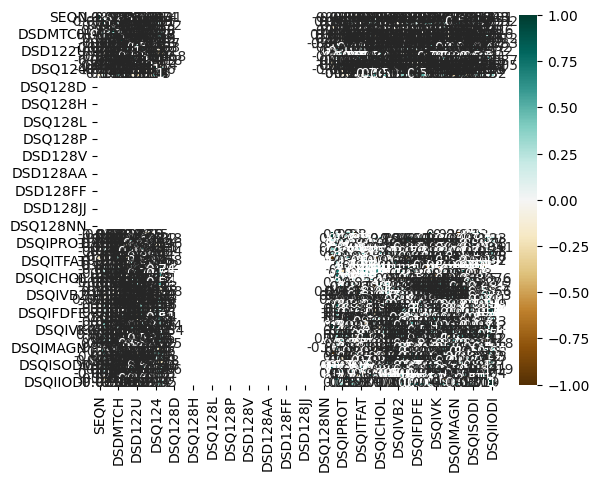

In [27]:
sns.heatmap(df.corr(),cmap ='BrBG',annot =True)

In [29]:
sns.pairplot(df, hue='DSQ128N')

KeyboardInterrupt: 